# Basketball Score Tracking

## Project Overview

The goal of this project is to develop a Computer Vision system capable of automatically tracking the score of a basketball game.

The project will begin by evaluating pretrained object detection models on basketball footage. The first objective is to reliably detect the main visual elements required by the system, particularly players and the basketball.

After establishing a reliable detection pipeline, the project will gradually expand to object tracking, ball trajectory analysis, shot detection, made/missed classification, team identification, and eventually real-time score tracking from a mobile camera.

In [32]:
#%pip install ultralytics opencv-python matplotlib
#%pip install torch==2.13.0 torchvision==0.28.0 --index-url https://download.pytorch.org/whl/cu126
#%pip uninstall -y torch torchvision torchaudio
#%config Completer.use_jedi = False
#%pip install pandas
#%pip install rfdetr
import cv2
import torch
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO, RTDETR
from pathlib import Path
from rfdetr import RFDETRNano
from PIL import Image

from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn_v2,
    FasterRCNN_ResNet50_FPN_V2_Weights
)

# Hardware(GPU) Check
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA version:", torch.version.cuda)
else:
    print("GPU not available - running on CPU")


PyTorch version: 2.13.0+cu126
CUDA available: True
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU
CUDA version: 12.6


## 1. Baseline Object Detection

The first stage of the project evaluates how well pretrained object detection models perform on basketball footage before any custom training is performed.

The baseline will focus on the objects required for the later stages of the system:

- Players
- Basketball
- Basketball rim

The main objective is to determine whether the pretrained models provide sufficiently reliable detections, particularly for the basketball, which is a small and fast-moving object.

Several model sizes will later be compared in order to evaluate the trade-off between detection performance and inference speed.

## 2. Baseline Test Videos

Before evaluating pretrained detection models, a small and diverse baseline video set was prepared.

The purpose of this set is to evaluate the models under different basketball scenarios and identify potential failure cases before any fine-tuning is performed.

The selected videos include variations in:

- Object size and camera distance
- Lighting conditions
- Ball and player occlusion
- Number of players in the frame
- Camera angle
- Different basketball actions

The four baseline scenarios are:

- Outdoor shot during sunset
- Layup with ball occlusion
- Multi-player scene with player occlusion
- Wide-angle daylight shot

In [3]:
from pathlib import Path

video_dir = Path("data/raw/videos")

test_videos = {
    "Outdoor Sunset Shot": video_dir / "outdoor_sunset_shot_01.mp4",
    "Layup with Occlusion": video_dir / "layup_occlusion_01.mp4",
    "Multi-Player Occlusion": video_dir / "multi_player_occlusion_01.mp4",
    "Wide-Angle Daylight Shot": video_dir / "wide_angle_daylight_shot_01.mp4",
}

for name, path in test_videos.items():
    print(f"{name}: {path}")

Outdoor Sunset Shot: data\raw\videos\outdoor_sunset_shot_01.mp4
Layup with Occlusion: data\raw\videos\layup_occlusion_01.mp4
Multi-Player Occlusion: data\raw\videos\multi_player_occlusion_01.mp4
Wide-Angle Daylight Shot: data\raw\videos\wide_angle_daylight_shot_01.mp4


In [4]:
def extract_frame(video_path, frame_ratio=0.3):
    # Open the video file
    cap = cv2.VideoCapture(str(video_path))
    
    # Verify that the video was opened successfully
    if not cap.isOpened():
        print(f"Could not open video: {video_path}")
        return None
    
    # Get the total number of frames in the video
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Handle empty or invalid video files
    if total_frames == 0:
        print(f"No frames found in video: {video_path}")
        cap.release()
        return None
    
    # Select a frame based on the requested relative position in the video
    target_frame = int(total_frames * frame_ratio)
    cap.set(cv2.CAP_PROP_POS_FRAMES, target_frame)
    
    # Read the selected frame
    success, frame = cap.read()
    cap.release()
    
    # Handle cases where the frame could not be read
    if not success:
        print(f"Could not read frame from: {video_path}")
        return None
    
    # Convert the frame from OpenCV's BGR format to RGB for visualization
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    return frame_rgb

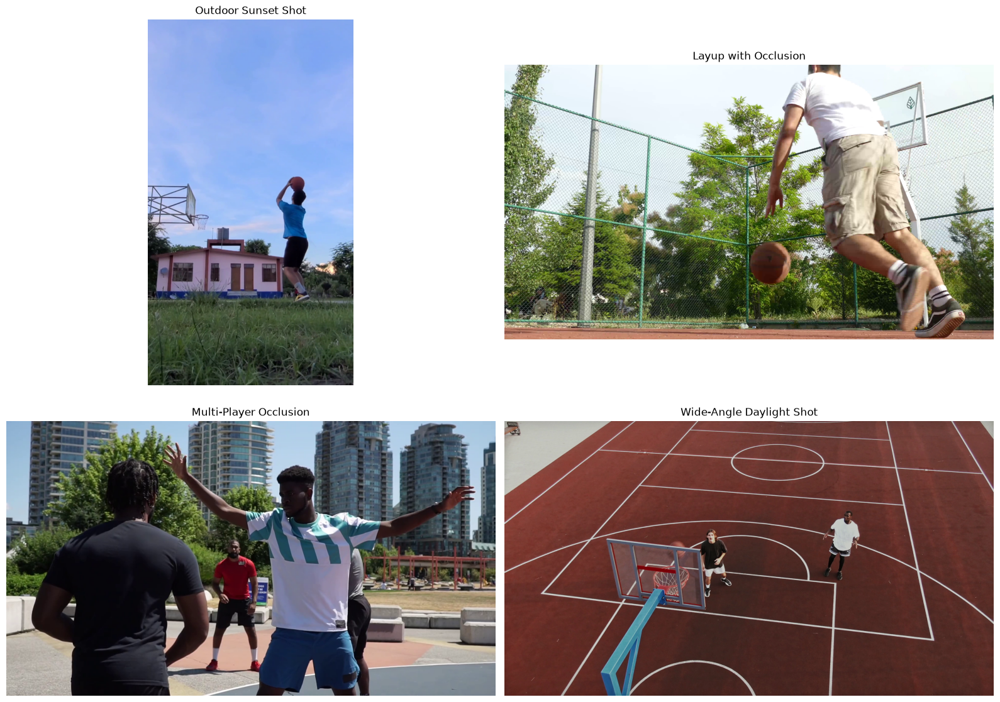

In [5]:
# Store one representative frame from each test video
frames = {}

for name, path in test_videos.items():
    frames[name] = extract_frame(path, frame_ratio=0.4)

# Create a figure for displaying all extracted frames
plt.figure(figsize=(16, 12))

# Display each frame in a 2x2 grid
for i, (name, frame) in enumerate(frames.items(), start=1):
    plt.subplot(2, 2, i)
    
    if frame is not None:
        # Display the extracted frame
        plt.imshow(frame)
        plt.title(name, fontsize=12)
        plt.axis("off")
    else:
        # Display a fallback message if the frame could not be extracted
        plt.text(
            0.5,
            0.5,
            "Frame not available",
            ha="center",
            va="center"
        )
        plt.title(name, fontsize=12)
        plt.axis("off")

# Adjust spacing between subplots and display the figure
plt.tight_layout()
plt.show()

### Baseline Test Set Summary

The selected videos represent different challenges that are expected to affect detection performance:

- **Outdoor Sunset Shot** - low-angle outdoor shot with sunset lighting.
- **Layup with Occlusion** - close-range layup with potential ball occlusion near the player.
- **Multi-Player Occlusion** - several players in the same scene with partial player overlap and limited ball visibility.
- **Wide-Angle Daylight Shot** - wide camera view where the basketball and players appear smaller in the frame.

These cases will be used to compare pretrained model performance before any fine-tuning is applied.

## 3. Pretrained Baseline Models

### Load the Pretrained Models

In [26]:
# Load pretrained YOLO and RT-DETR models
models = {
    "YOLO11n": YOLO("yolo11n.pt"),
    "YOLO11s": YOLO("yolo11s.pt"),
    "YOLO11m": YOLO("yolo11m.pt"),

    "YOLO26n": YOLO("yolo26n.pt"),
    "YOLO26s": YOLO("yolo26s.pt"),
    "YOLO26m": YOLO("yolo26m.pt"),

    "RT-DETR-L": RTDETR("rtdetr-l.pt")
}


In [20]:
# Load pretrained Faster R-CNN
faster_rcnn_weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT

faster_rcnn = fasterrcnn_resnet50_fpn_v2(
    weights=faster_rcnn_weights
)

faster_rcnn = faster_rcnn.to("cuda")
faster_rcnn.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, 

### Relevant Pretrained Classes

In [24]:
# ============================================================
# Relevant classes for all detection models
# ============================================================

# Classes relevant to the current stage of the project
relevant_classes = ["person", "sports ball"]


# ------------------------------------------------------------
# Ultralytics models: YOLO and RT-DETR
# ------------------------------------------------------------

# Get the COCO class mapping from one Ultralytics model
ultralytics_class_names = models["YOLO11n"].names

# Find and store the relevant class IDs
relevant_class_ids = []

for class_id, class_name in ultralytics_class_names.items():
    if class_name in relevant_classes:
        relevant_class_ids.append(class_id)

print("Ultralytics relevant classes:")

for class_id in relevant_class_ids:
    print(f"{class_id}: {ultralytics_class_names[class_id]}")

print("Relevant class IDs:", relevant_class_ids)


# ------------------------------------------------------------
# Faster R-CNN
# ------------------------------------------------------------

# Get the COCO class mapping used by Faster R-CNN
faster_rcnn_categories = faster_rcnn_weights.meta["categories"]

# Find and store the corresponding class IDs
faster_relevant_class_ids = []

for class_name in relevant_classes:
    class_id = faster_rcnn_categories.index(class_name)
    faster_relevant_class_ids.append(class_id)

print("\nFaster R-CNN relevant classes:")

for class_id in faster_relevant_class_ids:
    print(f"{class_id}: {faster_rcnn_categories[class_id]}")

print("Relevant class IDs:", faster_relevant_class_ids)

Ultralytics relevant classes:
0: person
32: sports ball
Relevant class IDs: [0, 32]

Faster R-CNN relevant classes:
1: person
37: sports ball
Relevant class IDs: [1, 37]


## 4. First Baseline Detection

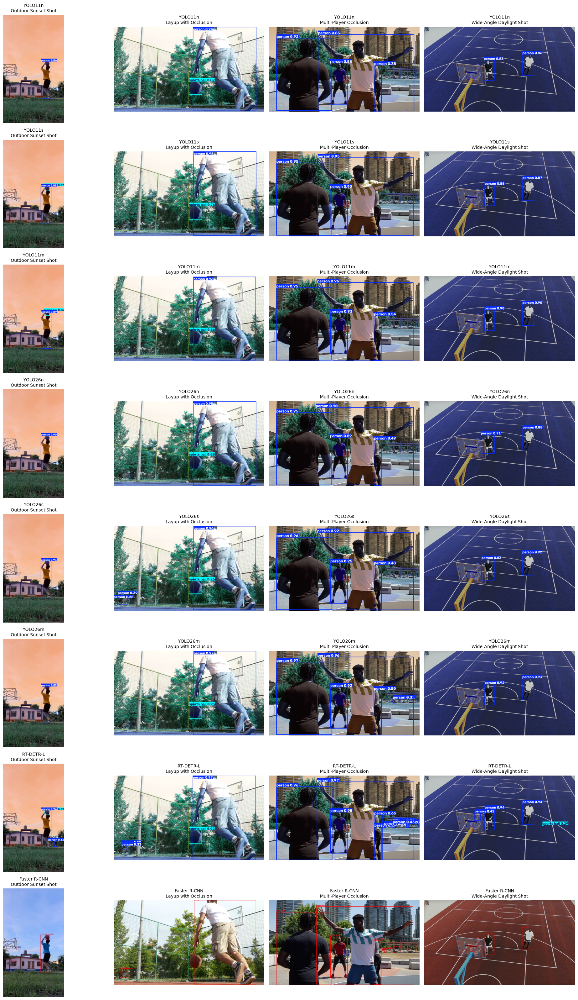

In [25]:
# ============================================================
# Compare all detection models on the same baseline frames
# ============================================================

# Total number of model rows in the comparison figure
total_models = len(models) + 1

plt.figure(figsize=(20, 4 * total_models))

plot_index = 1


# ------------------------------------------------------------
# Ultralytics models: YOLO11, YOLO26 and RT-DETR
# ------------------------------------------------------------

for model_name, model in models.items():
    for frame_name, frame in frames.items():
        if frame is None:
            continue

        # Run detection only for the relevant classes
        result = model.predict(
            source=frame,
            classes=relevant_class_ids,
            conf=0.25,
            device=0,
            verbose=False
        )[0]

        # Draw bounding boxes, labels and confidence scores
        annotated_frame = result.plot()

        # Convert BGR output to RGB for Matplotlib
        annotated_frame = cv2.cvtColor(
            annotated_frame,
            cv2.COLOR_BGR2RGB
        )

        # Display the prediction
        plt.subplot(
            total_models,
            len(frames),
            plot_index
        )

        plt.imshow(annotated_frame)
        plt.title(
            f"{model_name}\n{frame_name}",
            fontsize=10
        )
        plt.axis("off")

        plot_index += 1


# ------------------------------------------------------------
# Faster R-CNN
# ------------------------------------------------------------

for frame_name, frame in frames.items():
    if frame is None:
        continue

    # Convert the RGB NumPy image from H x W x C
    # to a PyTorch tensor in C x H x W format
    image_tensor = (
        torch.from_numpy(frame)
        .permute(2, 0, 1)
        .float()
        / 255.0
    )

    # Move the image to the GPU
    image_tensor = image_tensor.to("cuda")

    # Run inference without calculating gradients
    with torch.no_grad():
        prediction = faster_rcnn([image_tensor])[0]

    # Copy the original frame before drawing detections
    annotated_frame = frame.copy()

    # Process every detected object
    for box, label, score in zip(
        prediction["boxes"],
        prediction["labels"],
        prediction["scores"]
    ):
        label = int(label.item())
        score = float(score.item())

        # Keep only person and sports ball detections
        if label not in faster_relevant_class_ids:
            continue

        # Apply the same confidence threshold used by the other models
        if score < 0.25:
            continue

        # Convert bounding-box coordinates to integers
        x1, y1, x2, y2 = box.int().cpu().tolist()

        # Get the detected class name
        class_name = faster_rcnn_categories[label]

        # Draw the bounding box
        cv2.rectangle(
            annotated_frame,
            (x1, y1),
            (x2, y2),
            (255, 0, 0),
            3
        )

        # Draw the class name and confidence score
        cv2.putText(
            annotated_frame,
            f"{class_name} {score:.2f}",
            (x1, max(y1 - 10, 20)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (255, 0, 0),
            2
        )

    # Display the Faster R-CNN prediction
    plt.subplot(
        total_models,
        len(frames),
        plot_index
    )

    plt.imshow(annotated_frame)
    plt.title(
        f"Faster R-CNN\n{frame_name}",
        fontsize=10
    )
    plt.axis("off")

    plot_index += 1


plt.tight_layout()
plt.show()

### Initial Baseline Conclusion

The current comparison is based on a small baseline set and does not provide a broad or final evaluation of model performance.

However, the results show that the generic pretrained models produced broadly similar behavior and similar failure cases, especially in challenging situations such as small basketballs, occlusion, and wide-angle views.

Because the differences between the models were limited in this initial test, the next stage will focus on a different comparison strategy.

Instead of continuing with a large group of generic models, the project will proceed with three selected candidates for further evaluation. These models will be tested in a more targeted way in order to identify a stronger foundation for future fine-tuning.

## 5. Targeted Model Selection
# PART 2
The initial baseline showed similar performance and similar failure cases across the generic pretrained models.

The next stage will focus on three selected candidates:

- **Generic YOLO model** - a general-purpose COCO pretrained model used as the baseline.
- **Basketball-specific YOLO model** - a YOLO model already fine-tuned on basketball data.
- **Basketball-specific non-YOLO model** - a different detection architecture already trained on basketball data.

The goal is to determine whether basketball-specific pretraining provides a stronger foundation for future fine-tuning, and whether the model architecture itself makes a meaningful difference.

All three candidates will be evaluated on the same basketball scenarios.

The comparison will focus on:

- Basketball detection
- Player detection
- Rim detection
- Missed detections
- False positives
- Confidence scores
- Inference speed

The goal of this stage is to select the strongest starting model for future fine-tuning on a custom basketball dataset.

In [36]:
# ============================================================
# Load the three selected candidate models
# ============================================================

# 1. Generic YOLO model trained on COCO
generic_yolo = YOLO("yolo11m.pt")

# 2. Basketball-specific YOLO model
basketball_yolo = YOLO(
    "models/BODD_yolov8n_0001.pt"
)

# 3. Basketball-specific RF-DETR Nano model
basketball_rfdetr = RFDETRNano(
    pretrain_weights="models/BODD_rf-detr-nano_0000/checkpoint_best_total.pth"
)


# ============================================================
# Display only the relevant class IDs
# ============================================================

print("Generic YOLO11m:")
print("0: person")
print("32: sports ball")

print("\nBasketball-specific YOLO:")
for class_id, class_name in basketball_yolo.names.items():
    print(f"{class_id}: {class_name}")

print("\nBasketball-specific RF-DETR Nano:")
print("0: basketball")
print("1: hoop")
print("2: player")
print("3: referee")

[2026-09-05 00:17:36] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-09-05 00:17:36] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-09-05 00:17:37] [WARNING] rf-detr - Checkpoint has 3 classes but model is configured for 90. Using checkpoint class count (3). Pass num_classes=3 to suppress this warning.


Generic YOLO11m:
0: person
32: sports ball

Basketball-specific YOLO:
0: basketball
1: hoop
2: player
3: referee

Basketball-specific RF-DETR Nano:
0: basketball
1: hoop
2: player
3: referee


### Targeted Candidate Comparison

The three selected candidate models are now evaluated on the same baseline frames:

- **YOLO11m** - generic COCO pretrained baseline
- **E-BARD YOLOv8n** - basketball-specific YOLO model
- **E-BARD RF-DETR Nano** - basketball-specific transformer model

All models are evaluated using the same confidence threshold and image resolution where possible.

The comparison focuses on basketball and player detection, while the basketball-specific models are also able to detect the hoop.

[2026-09-05 00:20:54] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. For full GPU throughput (e.g. ~8x on T4 via FP16 Tensor Cores), call model.inference(dtype=torch.float16).


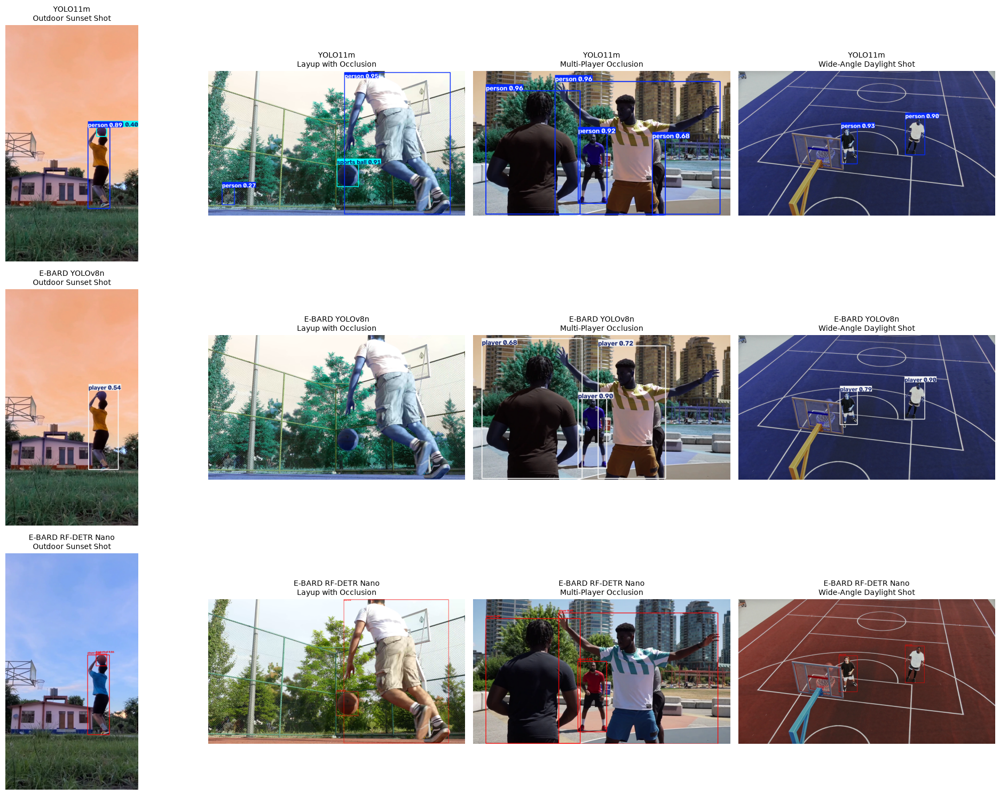

In [37]:
# ============================================================
# Compare the three selected candidate models
# ============================================================

confidence_threshold = 0.25
image_size = 704

# Class IDs used by each model
generic_yolo_classes = [0, 32]       # person, sports ball
basketball_yolo_classes = [0, 1, 2] # basketball, hoop, player

# RF-DETR class names
rfdetr_class_names = {
    0: "basketball",
    1: "hoop",
    2: "player",
    3: "referee"
}

plt.figure(figsize=(20, 15))

plot_index = 1


# ------------------------------------------------------------
# 1. Generic YOLO11m
# ------------------------------------------------------------

for frame_name, frame in frames.items():
    if frame is None:
        continue

    result = generic_yolo.predict(
        source=frame,
        classes=generic_yolo_classes,
        imgsz=image_size,
        conf=confidence_threshold,
        device=0,
        verbose=False
    )[0]

    annotated_frame = result.plot()

    # Convert BGR output to RGB for Matplotlib
    annotated_frame = cv2.cvtColor(
        annotated_frame,
        cv2.COLOR_BGR2RGB
    )

    plt.subplot(3, len(frames), plot_index)
    plt.imshow(annotated_frame)
    plt.title(f"YOLO11m\n{frame_name}", fontsize=10)
    plt.axis("off")

    plot_index += 1


# ------------------------------------------------------------
# 2. Basketball-specific E-BARD YOLOv8n
# ------------------------------------------------------------

for frame_name, frame in frames.items():
    if frame is None:
        continue

    result = basketball_yolo.predict(
        source=frame,
        classes=basketball_yolo_classes,
        imgsz=image_size,
        conf=confidence_threshold,
        device=0,
        verbose=False
    )[0]

    annotated_frame = result.plot()

    # Convert BGR output to RGB for Matplotlib
    annotated_frame = cv2.cvtColor(
        annotated_frame,
        cv2.COLOR_BGR2RGB
    )

    plt.subplot(3, len(frames), plot_index)
    plt.imshow(annotated_frame)
    plt.title(f"E-BARD YOLOv8n\n{frame_name}", fontsize=10)
    plt.axis("off")

    plot_index += 1


# ------------------------------------------------------------
# 3. Basketball-specific E-BARD RF-DETR Nano
# ------------------------------------------------------------

for frame_name, frame in frames.items():
    if frame is None:
        continue

    # Convert the NumPy RGB frame to a PIL image
    pil_image = Image.fromarray(frame)

    # Run RF-DETR inference
    detections = basketball_rfdetr.predict(
        pil_image,
        resolution=image_size,
        conf_threshold=confidence_threshold
    )

    # Copy the original frame before drawing detections
    annotated_frame = frame.copy()

    for box, class_id, confidence in zip(
        detections.xyxy,
        detections.class_id,
        detections.confidence
    ):
        class_id = int(class_id)

        # Ignore referee detections for the current comparison
        if class_id not in [0, 1, 2]:
            continue

        x1, y1, x2, y2 = map(int, box)

        class_name = rfdetr_class_names[class_id]

        # Draw the bounding box
        cv2.rectangle(
            annotated_frame,
            (x1, y1),
            (x2, y2),
            (255, 0, 0),
            3
        )

        # Draw the class name and confidence score
        cv2.putText(
            annotated_frame,
            f"{class_name} {confidence:.2f}",
            (x1, max(y1 - 10, 20)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (255, 0, 0),
            2
        )

    plt.subplot(3, len(frames), plot_index)
    plt.imshow(annotated_frame)
    plt.title(f"E-BARD RF-DETR Nano\n{frame_name}", fontsize=10)
    plt.axis("off")

    plot_index += 1


plt.tight_layout()
plt.show()